In [1]:
import pandas as pd
import glob
import os
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
import pickle
import sklearn
import numpy as np
import nltk 
nltk.download('punkt')
nltk.download('stopwords')
# stemmer = SnowballStemmer("german")

[nltk_data] Downloading package punkt to /home/pawan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/pawan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
data = pd.read_csv("/home/pawan/Questionnaire_new_version.csv")

In [3]:
data

,Documents,file_name,Text,Ground_Truth
0,document1,Nacaps-W1_questionnaire,"""Die Hochschule, an der Sie im Dezember 2018 z...","'wissenschaftssystem', 'betreuung', 'wissensch..."
1,document2,WeGe_W2,"""Wie ist dieser studienvorbereitende Kurs verl...","'integration', 'geflüchtete', 'studienkolleg',..."
2,document3,StuMa2020,"""Welchen Studienabschluss haben Sie in Ihrem l...","'beruflicher verbleib von exmatrikulierten', '..."
3,document4,Studierdenensurvey2016,"""An welcher Art Hochschule studieren Sie. Univ...","'evaluation', 'qualifikation', 'effizienz', 's..."
4,document5,Absolventen_2009.2_Haupt,"""Wie würden Sie Ihre derzeitige Tätigkeit bzw....",'hochschulforschung'
5,document6,Promopanel_W4,"""Waren oder sind Sie seit der letzten Befragun...","'promotion', 'hochschulforschung', 'promotion'..."
6,document7,Studienberechtigte_2008.3,"""Wie zufrieden sind Sie mit Ihrem bisherigen B...","'studienberechtigte', 'hochschulforschung'"
7,document8,Wissenschaftlerbefragung2016,"""In welcher Sprache möchten Sie die Befragung ...",'hochschulforschung'
8,document9,Promopanel_W3,"""Waren oder sind Sie seit der letzten Befragun...","'promotion', 'hochschulforschung', 'promotion'..."
9,document10,Sozialerhebung20,"""Welchen Abschluss streben Sie in Ihrem derzei...",'hochschulforschung'


In [4]:
file_name = ['Nacaps_2018','WeGe_W2','StuMa2020','Studierdenensurvey2016','Absolventen_20092_Haupt','Promopanel_W4','Studienberechtigte_2008.3',
'Wissenschaftlerbefragung2016','Promopanel_W3','Sozialerhebung20','WeGe_W3','Promopanel_W5','sid_corona','Promopanel_W2','Absolventen_2013-2','Absolventen_20092_Promotion',
'Sozialerhebung21','Absolventen_20092_Mobilität','Sozialerhebung19']

In [5]:
GT_within_text = [['wissenschaftssystem', 'betreuung', 'wissenschaftliche karriere', 'vereinbarkeit von familie und beruf', 'promovierende', 'promotion', 'finanzierung', 'mobilität', 'gesundheit'],
 ['geflüchtete', 'studienkolleg', 'studienvorbereitung'],
 ['masterstudium'],
 ['evaluation', 'qualifikation', 'studiensituation'],
 [''],
 ['promotion', 'arbeitsbedingungen','wissenschaftliche aktivitäten','weiterbildung', 'auslandsaufenthalt'],
 [''],
 [''],
 ['promotion', 'arbeitsbedingungen','wissenschaftliche aktivitäten', 'weiterbildung', 'auslandsaufenthalt'],
 [''],
 ['geflüchtete', 'studienkolleg', 'studienvorbereitung'],
 ['promotion', 'arbeitsbedingungen', 'weiterbildung','wissenschaftliche aktivitäten', 'auslandsaufenthalt', 'gesundheit'],
 ['digitale lehre', 'wohnsituation', 'finanzielle situation', 'studiensituation', 'corona'],
 ['promotion', 'arbeitsbedingungen', 'weiterbildung', 'auslandsaufenthalt'],
 [''],
 [''],
 [''],
 [''],
 ['']]

In [6]:
GT_within_text

[['wissenschaftssystem',
  'betreuung',
  'wissenschaftliche karriere',
  'vereinbarkeit von familie und beruf',
  'promovierende',
  'promotion',
  'finanzierung',
  'mobilität',
  'gesundheit'],
 ['geflüchtete', 'studienkolleg', 'studienvorbereitung'],
 ['masterstudium'],
 ['evaluation', 'qualifikation', 'studiensituation'],
 [''],
 ['promotion',
  'arbeitsbedingungen',
  'wissenschaftliche aktivitäten',
  'weiterbildung',
  'auslandsaufenthalt'],
 [''],
 [''],
 ['promotion',
  'arbeitsbedingungen',
  'wissenschaftliche aktivitäten',
  'weiterbildung',
  'auslandsaufenthalt'],
 [''],
 ['geflüchtete', 'studienkolleg', 'studienvorbereitung'],
 ['promotion',
  'arbeitsbedingungen',
  'weiterbildung',
  'wissenschaftliche aktivitäten',
  'auslandsaufenthalt',
  'gesundheit'],
 ['digitale lehre',
  'wohnsituation',
  'finanzielle situation',
  'studiensituation',
  'corona'],
 ['promotion', 'arbeitsbedingungen', 'weiterbildung', 'auslandsaufenthalt'],
 [''],
 [''],
 [''],
 [''],
 ['']]

In [7]:
only_keywords = []
for i in range(len(GT_within_text)):
    only_keywords.append([])
    for j in range(len(GT_within_text[i])):
        if len(GT_within_text[i][j].split(" ")) == 1:
            only_keywords[i].append(GT_within_text[i][j])

In [8]:
only_keywords

[['wissenschaftssystem',
  'betreuung',
  'promovierende',
  'promotion',
  'finanzierung',
  'mobilität',
  'gesundheit'],
 ['geflüchtete', 'studienkolleg', 'studienvorbereitung'],
 ['masterstudium'],
 ['evaluation', 'qualifikation', 'studiensituation'],
 [''],
 ['promotion', 'arbeitsbedingungen', 'weiterbildung', 'auslandsaufenthalt'],
 [''],
 [''],
 ['promotion', 'arbeitsbedingungen', 'weiterbildung', 'auslandsaufenthalt'],
 [''],
 ['geflüchtete', 'studienkolleg', 'studienvorbereitung'],
 ['promotion',
  'arbeitsbedingungen',
  'weiterbildung',
  'auslandsaufenthalt',
  'gesundheit'],
 ['wohnsituation', 'studiensituation', 'corona'],
 ['promotion', 'arbeitsbedingungen', 'weiterbildung', 'auslandsaufenthalt'],
 [''],
 [''],
 [''],
 [''],
 ['']]

In [9]:
keyphrases_within_text = []
for i in range(len(GT_within_text)):
    keyphrases_within_text.append([])
    for j in range(len(GT_within_text[i])):
        if len(GT_within_text[i][j].split(" ")) > 1:
            keyphrases_within_text[i].append(GT_within_text[i][j])

In [10]:
keyphrases_within_text

[['wissenschaftliche karriere', 'vereinbarkeit von familie und beruf'],
 [],
 [],
 [],
 [],
 ['wissenschaftliche aktivitäten'],
 [],
 [],
 ['wissenschaftliche aktivitäten'],
 [],
 [],
 ['wissenschaftliche aktivitäten'],
 ['digitale lehre', 'finanzielle situation'],
 [],
 [],
 [],
 [],
 [],
 []]

In [11]:
gt = list(data['Ground_Truth'])

In [12]:
gt

["'wissenschaftssystem', 'betreuung', 'wissenschaftliche karriere', 'promotionsformen', 'promotionsmotive', 'vereinbarkeit von familie und beruf', 'monetäre erträge', 'nicht-monetäre erträge', 'wissenschaftlicher nachwuchs', 'promotionsabbruch', 'promovierende', 'promotion', 'strukturierte promotion', 'persönlichkeit', 'finanzierung', 'mobilität', 'gesundheit', 'erwerbsverläufe', 'arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft', 'promovierte'",
 "'integration', 'geflüchtete', 'studienkolleg', 'migration', 'studienvorbereitung'",
 "'beruflicher verbleib von exmatrikulierten', 'studiensituation', 'studienabbruch', 'masterstudium', 'abbruchursachen'",
 "'evaluation', 'qualifikation', 'effizienz', 'studiensituation', 'zeitreihen', 'studierendenbefragung', 'hochschulforschung'",
 "'hochschulforschung'",
 "'promotion', 'hochschulforschung', 'promotion', 'promotionsbedingungen', 'promotionsbetreuung', 'promotionsfinanzierung', 'bildungsverlauf', 'berufsverlauf', 'beschäftigungsbe

In [13]:
ground_truth_not_in_text = [['promotionsformen', 'promotionsmotive',  'monetäre erträge', 'nicht-monetäre erträge', 'wissenschaftlicher nachwuchs','promotionsabbruch', 'strukturierte promotion', 'persönlichkeit', 'erwerbsverläufe', 'promovierte'],
                            ['integration', 'migration'], 
                            ['beruflicher verbleib von exmatrikulierten', 'studiensituation', 'studienabbruch', 'abbruchursachen'],
                            ['effizienz, zeitreihen', 'studierendenbefragung', 'hochschulforschung'], 
                            ['hochschulforschung'], 
                            ['hochschulforschung'],
                            ['studienberechtigte', 'hochschulforschung'], 
                            ['hochschulforschung'], 
                            ['hochschulforschung'],
                            ['hochschulforschung'],
                            ['integration', 'migration'], 
                            ['hochschulforschung'], 
                            ['internationale studierende', 'finanzielle situation', 'studienerfolg', 'erwerbstätige studierende', 'persönlichkeit', 'beeinträchtigt studierende', 'studierende', 'gesundheit', 'studierendenforschung', 'hochschulforschung'],
                            ['hochschulforschung'],
                            ['absolventen', 'hochschulforschung'], 
                            ['hochschulforschung'], 
                            ['hochschulforschung'], 
                            ['hochschulforschung'], 
                            ['hochschulforschung']]

In [14]:
ground_truth_not_in_text

[['promotionsformen',
  'promotionsmotive',
  'monetäre erträge',
  'nicht-monetäre erträge',
  'wissenschaftlicher nachwuchs',
  'promotionsabbruch',
  'strukturierte promotion',
  'persönlichkeit',
  'erwerbsverläufe',
  'promovierte'],
 ['integration', 'migration'],
 ['beruflicher verbleib von exmatrikulierten',
  'studiensituation',
  'studienabbruch',
  'abbruchursachen'],
 ['effizienz, zeitreihen', 'studierendenbefragung', 'hochschulforschung'],
 ['hochschulforschung'],
 ['hochschulforschung'],
 ['studienberechtigte', 'hochschulforschung'],
 ['hochschulforschung'],
 ['hochschulforschung'],
 ['hochschulforschung'],
 ['integration', 'migration'],
 ['hochschulforschung'],
 ['internationale studierende',
  'finanzielle situation',
  'studienerfolg',
  'erwerbstätige studierende',
  'persönlichkeit',
  'beeinträchtigt studierende',
  'studierende',
  'gesundheit',
  'studierendenforschung',
  'hochschulforschung'],
 ['hochschulforschung'],
 ['absolventen', 'hochschulforschung'],
 ['ho

In [15]:
data['Valid_Ground_Truth'] = GT_within_text

In [16]:
data['Ground_Truth_Not_In_Text'] = ground_truth_not_in_text

In [17]:
# file_list3 = ["/home/pawan/website_keywords_also_exist_within_thesaurus/" + elem + ".txt" for elem in file_name]                  
# GT_within_thesaurus = []

# for file_path in file_list3:
#     with open(file_path) as f_input:
#         GT_within_thesaurus.append(f_input.read())

In [18]:
# GT_within_thesaurus

In [19]:
GT_within_thesaurus_not_in_text = ['Promotion, persönlichkeit', 'integration,migration', 'studiensituation, studienabbruch', 'Effizienz, zeitreihen, hochschulforschung',
                                  'hochschulforschung','hochschulforschung', 'hochschulforschung', 'hochschulforschung', 'hochschulforschung', 'hochschulforschung',
                                   'integration,migration', 'hochschulforschung', 'finanzielle Situation, Studienerfolg, Persönlichkeit, Gesundheit Hochschulforschung', 
                                  'Hochschulforschung', 'Hochschulforschung', 'hochschulforschung', 'hochschulforschung', 'hochschulforschung','hochschulforschung']

In [20]:
GT_within_thesaurus_not_in_text

['Promotion, persönlichkeit',
 'integration,migration',
 'studiensituation, studienabbruch',
 'Effizienz, zeitreihen, hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'integration,migration',
 'hochschulforschung',
 'finanzielle Situation, Studienerfolg, Persönlichkeit, Gesundheit Hochschulforschung',
 'Hochschulforschung',
 'Hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung']

In [21]:
from nltk.corpus import stopwords
stop_words = stopwords.words('german')
stop_words
print(len(stop_words))
stop_words.extend(["a","ab","können","bzw", "usw","eu","wiwi","soz", "nah","dsh","and","eng","wahr", "kfz", "kiel", "öl", "fil" "sose", "ha","wi", "übt","wis","vwl","geben", "hhu","bitte","inkl", "läuft", "ggf", "ern", "te", "edv", "un","ver", "finno", "etc","ehe","kfw", "maße", "möchten", "cau", "juni", "uds", "innen", "aber","ach","acht","achte","achten","achter","achtes","ag","alle","fh","allein","allem","allen","aller","allerdings","alles","allgemeinen","als","also","am","an","andere","anderen","andern","anders","au","auch","auf","aus","ausser","außer","ausserdem","außerdem","b","bald","bei","beide","beiden","beim","beispiel","bekannt","bereits","besonders","besser","üben","besten","bin","sein","können","bis","bisher","bist","c","d","da","dabei","dadurch","dafür","dagegen","daher","dahin","dahinter","damals","damit","danach","daneben","dank","dann","daran","darauf","daraus","darf","darfst","darin","darüber","darum","darunter","das","dasein","daselbst","dass","daß","dasselbe","davon","davor","dazu","dazwischen","dein","deine","deinem","deiner","dem","dementsprechend","demgegenüber","demgemäss","demgemäß","demselben","demzufolge","den","denen","denn","denselben","saarlandes","der","deren","derjenige","derjenigen","dermassen","dermaßen","derselbe","derselben","des","deshalb","desselben","dessen","deswegen","d.h","dich","die","diejenige","diejenigen","dies","diese","dieselbe","dieselben","diesem","diesen","dieser","dieses","dir","doch","dort","drei","drin","dritte","dritten","dritter","drittes","du","durch","durchaus","dürfen","dürft","durfte","durften","e","eben","ebenso","ehrlich","ei","ei,","eigen","eigene","eigenen","eigener","eigenes","ein","einander","eine","einem","einen","einer","eines","einige","einigen","einiger","einiges","einmal","eins","elf","en","ende","endlich","entweder","er","Ernst","erst","erste","ersten","erster","erstes","es","etwa","etwas","euch","f","früher","fünf","fünfte","fünften","fünfter","fünftes","für","g","gab","ganz","ganze","ganzen","ganzer","ganzes","gar","gedurft","gegen","gegenüber","gehabt","gehen","geht","gekannt","gekonnt","gemacht","gemocht","gemusst","genug","gerade","gern","gesagt","geschweige","gewesen","gewollt","geworden","gibt","ging","gleich","gott","gross","groß","grosse","große","grossen","großen","grosser","großer","grosses","großes","gut","gute","guter","gutes","h","habe","haben","habt","hast","hat","hatte","hätte","hatten","hätten","heisst","her","heute","hier","hin","hinter","hoch","i","ich","ihm","ihn","ihnen","ihr","ihre","ihrem","ihren","ihrer","ihres","im","immer","in","indem","infolgedessen","ins","irgend","ist","j","ja","jahr","jahre","jahren","je","jede","jedem","jeden","jeder","jedermann","jedermanns","jedoch","jemand","jemandem","jemanden","jene","jenem","jenen","jener","jenes","jetzt","k","kam","kann","kannst","kaum","kein","keine","keinem","keinen","keiner","kleine","kleinen","kleiner","kleines","kommen","kommt","können","könnt","konnte","könnte","konnten","kurz","l",
                   "lang","lange","leicht","leide","lieber","los","m","inn","usw ","dfg","machen", "erc","macht","machte","mag","magst","mahn","man","manche","manchem","manchen","mancher","manches","mann","mehr","mein","meine","meinem","meinen","meiner","meines","mensch","menschen","mich","mir","mit","mittel","mochte","möchte","mochten","düsseldorf","mögen","möglich","mögt","morgen","muss","muß","müssen","musst","müsst","musste","mussten","n","na","nach","pogs","vater","mutter","nachdem","nahm","natürlich","neben","nein","neue","neuen","neun","neunte","neunten","neunter","neuntes","nicht","nichts","nie","niemand","niemandem","niemanden","noch","nun","nur","o","ob","oben","oder","offen","oft","ohne","Ordnung","p","q","r","recht","rechte","rechten","rechter","rechtes","richtig","rund","s","sa","sache","sagt","sagte","sah","satt","schlecht","Schluss","schon","sechs","sechste","sechsten","sechster","sechstes","sehr","sei","seid","seien","sein","seine","seinem","seinen","seiner","seines","seit","seitdem","selbst","sich","sie","sieben","siebente","siebenten","siebenter","siebentes","sind","so","solang","solche","solchem","solchen","solcher","solches","soll","sollen","sollte","sollten","sondern","sonst","sowie","später","statt","t","tag","tage","tagen","tat","teil","tel","tritt","trotzdem","tun","u","über","überhaupt","übrigens","uhr","um","und","und?","uns","unser","unsere","unserer","unter","v","vergangenen","viel","viele","vielem","vielen","vielleicht","vier","vierte","vierten","vierter","viertes","vom","vor","w","wahr?","während","währenddem","währenddessen","wann","war","wäre","waren","wart","warum","was","wegen","weil","weit","weiter","weitere","weiteren","weiteres","welche","welchem","welchen","welcher","welches","wem","wen","wenig","wenige","weniger","weniges","wenigstens","wenn","wer","werde","werden","werdet","wessen","wie","wieder","will","willst","wir","wird","wirklich","wirst","wo","wohl","wollen","wollt","wollte","wollten","worden","wurde","würde","wurden","würden","x","y","z","z.b","zehn","zehnte","zehnten","zehnter","zehntes","zeit","zu","zuerst","zugleich","zum","zunächst","zur","zurück","zusammen","zwanzig","zwar","zwei","zweite","zweiten","zweiter","zweites","zwischen","zwölf","euer","eure","hattest","hattet","jedes","mußt","müßt","sollst","sollt","soweit","weshalb","wieso","woher","wohin"])
print(len(stop_words))

232
877


In [22]:
# def clean_text(text, for_embedding=False):
#     """
#         - remove any html tags (< /br> often found)
#         - Keep only ASCII + European Chars and whitespace, no digits
#         - remove single letter chars
#         - convert all whitespaces (tabs etc.) to single wspace
#         if not for embedding (but e.g. tdf-idf):
#         - all lowercase
#         - remove stopwords, punctuation and stemm
#     """
#     RE_WSPACE = re.compile(r"\s+", re.IGNORECASE)
#     RE_TAGS = re.compile(r"<[^>]+>")
#     RE_ASCII = re.compile(r"[^A-Za-zÀ-ž ]", re.IGNORECASE)
#     RE_SINGLECHAR = re.compile(r"\b[A-Za-zÀ-ž]\b", re.IGNORECASE)
# #     if for_embedding:
#         # Keep punctuation
# #         RE_ASCII = re.compile(r"[^A-Za-zÀ-ž,.!? ]", re.IGNORECASE)
# #         RE_SINGLECHAR = re.compile(r"\b[A-Za-zÀ-ž,.!?]\b", re.IGNORECASE)

#     text = re.sub(RE_TAGS, " ", text)
#     text = re.sub(RE_ASCII, " ", text)
#     text = re.sub(RE_SINGLECHAR, " ", text)
#     text = re.sub(RE_WSPACE, " ", text)

#     word_tokens = word_tokenize(text)
#     words_tokens_lower = [word.lower() for word in word_tokens]

#     if for_embedding:
#         # no stemming, lowering and punctuation / stop words removal
#         words_filtered = word_tokens
#     else:
#         words_filtered = [
#             word for word in words_tokens_lower if word not in stop_words
#         ] 

#     text_clean = " ".join(words_filtered)
#     return text_clean

In [23]:
def clean_text(text, for_embedding=False):
    """
        - remove any html tags (< /br> often found)
        - Keep only ASCII + European Chars and whitespace, no digits
        - remove single letter chars
        - convert all whitespaces (tabs etc.) to single wspace
        if not for embedding (but e.g. tdf-idf):
        - all lowercase
        - remove stopwords, punctuation and stemm
    """
    RE_WSPACE = re.compile(r"\s+", re.IGNORECASE)
    RE_TAGS = re.compile(r"<[^>]+>")
    RE_ASCII = re.compile(r"[^A-Za-zÀ-ž ]", re.IGNORECASE)
    RE_SINGLECHAR = re.compile(r"\b[A-Za-zÀ-ž]\b", re.IGNORECASE)
    if for_embedding:
         #Keep punctuation
        RE_ASCII = re.compile(r"[^A-Za-zÀ-ž.! ]", re.IGNORECASE)
        RE_SINGLECHAR = re.compile(r"\b[A-Za-zÀ-ž.!?]\b", re.IGNORECASE)

    text = re.sub(RE_TAGS, " ", text)
    text = re.sub(RE_ASCII, " ", text)
    text = re.sub(RE_SINGLECHAR, " ", text)
    text = re.sub(RE_WSPACE, " ", text)

    word_tokens = word_tokenize(text)
    words_tokens_lower = [word.lower() for word in word_tokens]

    if for_embedding:
        # no stemming, lowering and punctuation / stop words removal
        words_filtered = word_tokens
    else:
        words_filtered = [
            word for word in words_tokens_lower if word not in stop_words
        ] 

    text_clean = " ".join(words_filtered)
    return text_clean

In [24]:
data["clean_text"] = data["Text"].map(
    lambda x: clean_text(x, for_embedding=True) if isinstance(x, str) else x
)

In [25]:
data["clean_text"][0]

'Die Hochschule an der Sie im Dezember zur Promotion registriert waren hat ebenfalls Interesse daran mehr über die Promotionsbedingungen ihrer Promovierenden zu erfahren . Um Doppelbefragungen zu vermeiden möchten wir die von Ihnen innerhalb dieses Fragebogens angegebenen Antworten an Ihre Hochschule zum Zweck der Qualitätssicherung und Evaluation im Bereich der Doktorandenausbildung Ihr Einverständnis vorausgesetzt weiter geben . Ja ich bin mit der Weitergabe meiner Angaben an die Hochschule einverstanden . Nein ich bin mit der Weitergabe meiner Angaben an die Hochschule nicht einverstanden . Anfang Dezember waren Sie an Ihrer Hochschule offiziell als Doktorand in registriert . In der Zwischenzeit kann sich daran etwas geändert haben . Bitte geben Sie an was aktuell auf Sie zutrifft . Ich promoviere . Ich habe das Promotionsverfahren abgeschlossen . Ich habe mein Promotionsvorhaben unterbrochen . Ich habe mein Promotionsvorhaben abgebrochen . Handelt es sich um eine offiziell der Hoch

In [26]:
data["clean_text_wo_sw"] = data["Text"].map(
    lambda x: clean_text(x, for_embedding=False) if isinstance(x, str) else x
)

In [27]:
data["clean_text_wo_sw"][0]

'hochschule dezember promotion registriert ebenfalls interesse promotionsbedingungen promovierenden erfahren doppelbefragungen vermeiden innerhalb fragebogens angegebenen antworten hochschule zweck qualitätssicherung evaluation bereich doktorandenausbildung einverständnis vorausgesetzt weitergabe angaben hochschule einverstanden weitergabe angaben hochschule einverstanden anfang dezember hochschule offiziell doktorand registriert zwischenzeit geändert aktuell zutrifft promoviere promotionsverfahren abgeschlossen promotionsvorhaben unterbrochen promotionsvorhaben abgebrochen handelt offiziell hochschule gemeldete unterbrechung erinnern quartal arbeiten begonnen erinnern quartal zugelassen quartal quartal quartal quartal hochschule informiert promotion abgebrochen erinnern quartal promotion abgebrochen quartal quartal quartal quartal promotionsverfahren hochschule ausland beteiligt handelt gemeinsamen abschluss hochschulen ausland cotutelle de thèse promotionsverfahren fachhochschule hoc

In [28]:
Preprocesed_text = []
for i in range(len(data["clean_text"])):
    Preprocesed_text.append(re.sub(r'\s([?.!"](?:\s|$))', r'\1', data["clean_text"][i])) 

In [29]:
import re
test_text = []
for i in range(len(Preprocesed_text)):
    test_text.append(re.sub(r'\.+ ', ".",  Preprocesed_text[i]))

In [30]:
cleaned_text = []
for i in range(len(test_text)):
    for line in test_text[i].split('\n'):
        # Replace multiple dots with space
        line = re.sub('\.\.+', '.', line) 
        # Remove single dots
        cleaned_text.append(re.sub('\.', '.', line))

In [31]:
final_cleaned_text = []
for i in range(len(cleaned_text)):
    final_cleaned_text.append(re.sub(r"\.(?=\S)", ". ", cleaned_text[i]))

In [32]:
final_cleaned_text[0]

'Die Hochschule an der Sie im Dezember zur Promotion registriert waren hat ebenfalls Interesse daran mehr über die Promotionsbedingungen ihrer Promovierenden zu erfahren. Um Doppelbefragungen zu vermeiden möchten wir die von Ihnen innerhalb dieses Fragebogens angegebenen Antworten an Ihre Hochschule zum Zweck der Qualitätssicherung und Evaluation im Bereich der Doktorandenausbildung Ihr Einverständnis vorausgesetzt weiter geben. Ja ich bin mit der Weitergabe meiner Angaben an die Hochschule einverstanden. Nein ich bin mit der Weitergabe meiner Angaben an die Hochschule nicht einverstanden. Anfang Dezember waren Sie an Ihrer Hochschule offiziell als Doktorand in registriert. In der Zwischenzeit kann sich daran etwas geändert haben. Bitte geben Sie an was aktuell auf Sie zutrifft. Ich promoviere. Ich habe das Promotionsverfahren abgeschlossen. Ich habe mein Promotionsvorhaben unterbrochen. Ich habe mein Promotionsvorhaben abgebrochen. Handelt es sich um eine offiziell der Hochschule geme

In [33]:
data['final_cleaned_text'] = final_cleaned_text

In [34]:
import spacy
nlp = spacy.load('de_core_news_lg')

In [35]:
#using spacy model for POS tagging

Extracted_tags=[]
for i in range(len(data['final_cleaned_text'])):
    Extracted_tags.append([])
    doc = nlp(data['final_cleaned_text'][i])
    for t in doc:
        tag=t.pos_
        if tag: # for Noun, only "NOUN"
            if t.text not in Extracted_tags:
                Extracted_tags[i].append((t.text, t.pos_))  #for appending to it as a tuples: constructing a tuple

In [36]:
Extracted_tags[0]

[('Die', 'DET'),
 ('Hochschule', 'NOUN'),
 ('an', 'ADP'),
 ('der', 'DET'),
 ('Sie', 'PRON'),
 ('im', 'ADP'),
 ('Dezember', 'NOUN'),
 ('zur', 'ADP'),
 ('Promotion', 'NOUN'),
 ('registriert', 'VERB'),
 ('waren', 'AUX'),
 ('hat', 'AUX'),
 ('ebenfalls', 'ADV'),
 ('Interesse', 'NOUN'),
 ('daran', 'ADV'),
 ('mehr', 'ADV'),
 ('über', 'ADP'),
 ('die', 'DET'),
 ('Promotionsbedingungen', 'NOUN'),
 ('ihrer', 'DET'),
 ('Promovierenden', 'NOUN'),
 ('zu', 'PART'),
 ('erfahren', 'VERB'),
 ('.', 'PUNCT'),
 ('Um', 'SCONJ'),
 ('Doppelbefragungen', 'NOUN'),
 ('zu', 'PART'),
 ('vermeiden', 'VERB'),
 ('möchten', 'AUX'),
 ('wir', 'PRON'),
 ('die', 'DET'),
 ('von', 'ADP'),
 ('Ihnen', 'PRON'),
 ('innerhalb', 'ADP'),
 ('dieses', 'DET'),
 ('Fragebogens', 'NOUN'),
 ('angegebenen', 'ADJ'),
 ('Antworten', 'NOUN'),
 ('an', 'ADP'),
 ('Ihre', 'DET'),
 ('Hochschule', 'NOUN'),
 ('zum', 'ADP'),
 ('Zweck', 'NOUN'),
 ('der', 'DET'),
 ('Qualitätssicherung', 'NOUN'),
 ('und', 'CCONJ'),
 ('Evaluation', 'NOUN'),
 ('im', 'ADP'

In [37]:
# from germalemma import GermaLemma
# lemmatizer = GermaLemma()
# lemmatized_words = []
# nlp = spacy.load('de_core_news_lg')

# for i in range(len(Extracted_tags)):
#     lemmatized_words.append([])
#     lemma_spacy = nlp(data["clean_text"][i])
#     for j in range(len(lemma_spacy)):
#         token = lemma_spacy[j]
#         if token.pos_ not in ['NOUN','ADJ','VERB','ADV']:
#             lemmatized_words[i].append(token.lemma_)
#         else:
#             temp = Extracted_tags[i][j][1]
#             lemmatized_words[i].append(lemmatizer.find_lemma(Extracted_tags[i][j][0], Extracted_tags[i][j][1]))


In [38]:
# # converting the list of tokens into string
# lemmatized_corpus = [' '.join(x) for x in lemmatized_words]
# print(lemmatized_corpus[0]) 

In [39]:
#adding column to the dataframe

# data['clean_text_w_lemma'] = lemmatized_corpus

In [40]:
#Lemmatization on the corpus text which contains all the stopwords.

#spacy model does not have a good lemmatizer as the accuracy of the model for lemmatization is 73%

# clean_text_w_lemma_w_sw = []  # clean text with lemmatization

# for words in data["clean_text"]:
#      doc = nlp(words)
#      result = ' '.join([token.lemma_ for token in doc]) 
#      clean_text_w_lemma_w_sw.append(result)

In [41]:
sample_data = (data['clean_text']).tolist()

In [42]:
sample_data[0]

'Die Hochschule an der Sie im Dezember zur Promotion registriert waren hat ebenfalls Interesse daran mehr über die Promotionsbedingungen ihrer Promovierenden zu erfahren . Um Doppelbefragungen zu vermeiden möchten wir die von Ihnen innerhalb dieses Fragebogens angegebenen Antworten an Ihre Hochschule zum Zweck der Qualitätssicherung und Evaluation im Bereich der Doktorandenausbildung Ihr Einverständnis vorausgesetzt weiter geben . Ja ich bin mit der Weitergabe meiner Angaben an die Hochschule einverstanden . Nein ich bin mit der Weitergabe meiner Angaben an die Hochschule nicht einverstanden . Anfang Dezember waren Sie an Ihrer Hochschule offiziell als Doktorand in registriert . In der Zwischenzeit kann sich daran etwas geändert haben . Bitte geben Sie an was aktuell auf Sie zutrifft . Ich promoviere . Ich habe das Promotionsverfahren abgeschlossen . Ich habe mein Promotionsvorhaben unterbrochen . Ich habe mein Promotionsvorhaben abgebrochen . Handelt es sich um eine offiziell der Hoch

In [43]:
sample_data_wo_sw = (data['clean_text_wo_sw']).tolist()

In [44]:
# sample_data_w_lemma= data['clean_text_w_lemma'].tolist()

In [45]:
sample_cleaned_data = data['final_cleaned_text'].tolist()

In [46]:
new_df =data['final_cleaned_text'].str.split(expand=True).stack().value_counts().reset_index()
 
new_df.columns = ['Word', 'Frequency'] 
 
new_df

,Word,Frequency
0,Sie,1419
1,der,1002
2,in,1001
3,und,793
4,die,776
...,...,...
8484,spontan,1
8485,treffe,1
8486,Dienstwagennutzung.,1
8487,Sächliche,1


In [47]:
len(new_df)

8489

In [48]:
new_df[0:5]

,Word,Frequency
0,Sie,1419
1,der,1002
2,in,1001
3,und,793
4,die,776


(array([1419.,    0., 1002.,    0.,    0., 1001.,    0.,  793.,    0.,
         776.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <BarContainer object of 10 artists>)

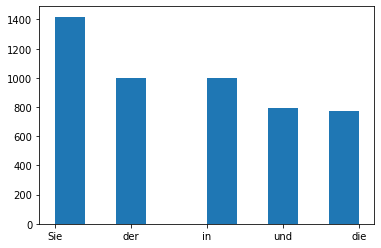

In [49]:
from matplotlib.pyplot import hist

hist(new_df[0:5].Word, weights=new_df[0:5].Frequency)

In [50]:
#Calculating Document Frequency

from collections import defaultdict
import math

DF = {}
for i in range(len(data['final_cleaned_text'])):
    tokens = nltk.word_tokenize(data['final_cleaned_text'][i]) #without nltk.word_tokenize, it gives character level DF
    for w in tokens:
            try:
                DF[w].add(i)
            except:
                DF[w] = {i}

In [51]:
len(DF) #Total Unique words

7260

In [52]:
for word,freq in DF.items():
    print(word,len(freq))

Die 16
Hochschule 18
an 19
der 19
Sie 19
im 19
Dezember 3
zur 17
Promotion 14
registriert 2
waren 15
hat 13
ebenfalls 1
Interesse 11
daran 5
mehr 15
über 17
die 19
Promotionsbedingungen 1
ihrer 6
Promovierenden 3
zu 19
erfahren 5
. 19
Um 10
Doppelbefragungen 1
vermeiden 4
möchten 8
wir 11
von 19
Ihnen 16
innerhalb 10
dieses 7
Fragebogens 1
angegebenen 4
Antworten 2
Ihre 18
zum 17
Zweck 3
Qualitätssicherung 1
und 19
Evaluation 2
Bereich 4
Doktorandenausbildung 2
Ihr 18
Einverständnis 2
vorausgesetzt 1
weiter 6
geben 15
Ja 13
ich 18
bin 16
mit 19
Weitergabe 1
meiner 18
Angaben 7
einverstanden 1
Nein 13
nicht 19
Anfang 4
Ihrer 19
offiziell 3
als 19
Doktorand 3
in 19
In 18
Zwischenzeit 1
kann 13
sich 19
etwas 14
geändert 1
haben 19
Bitte 19
was 8
aktuell 9
auf 18
zutrifft 3
Ich 18
promoviere 6
habe 17
das 18
Promotionsverfahren 1
abgeschlossen 17
mein 15
Promotionsvorhaben 1
unterbrochen 9
abgebrochen 10
Handelt 6
es 18
um 16
eine 19
gemeldete 1
Unterbrechung 2
Können 3
noch 18
erinnern 1


denken 10
aussehen 1
insgesamt 14
Ihres 14
Fachs 1
spiel 1
dafür 12
Rolle 5
hohe 4
Arbeitsbelastung 2
Veränderung 2
Lebenssituation 8
neuer 3
Arbeitsplatz 9
Gesundheitliche 7
Aufnahme 6
Beschäftigungsverhältnisses 2
schwer 3
realisierbar 3
herausgestellt 1
Zweifel 6
Eignung 2
Mangelndes 2
ausreichende 5
Finanzierung 9
Promotionsphase 2
weiterhilft 1
methodischen 1
technischen 1
behilflich 1
seinem 4
Fachwissen 4
Seite 1
steht 6
emotional 1
offenes 1
Ohr 1
Sorgen 3
schwierigen 4
Zeiten 3
Mut 1
macht 9
vermittelt 1
Forschungsthema 2
besonders 6
relevant 1
Ausbau 1
Netzwerke 6
hilft 1
Tipps 1
verschafft 2
beeinflussen 1
könnten 3
Zugang 3
benötigten 2
Ressourcen 3
weiterhalf 1
stand 3
machte 2
Forschern 2
vermittelte 1
unterstützte 1
half 1
gab 2
verschaffte 1
konnten 2
Promotionszeitraum 1
gewährleistet 1
denen 8
te 3
alternativen 2
Betreuungsmöglichkeiten 3
umsehen 1
stellt 3
Anspruch 5
fortlaufend 1
Stand 4
werden 16
regelmäßige 2
Termine 2
besprechen 2
häufig 12
Rechenschaft 1
ablegen

Anforderungsniveaus 1
Stofffülle 1
Selbständigkeit 5
Studiengestaltung 1
Prüfungsdichte 1
Studieren 2
Lage 5
Selbststudium 4
nachbereitet 1
meist 2
Bank 5
geschoben 1
Prüfungssituationen 2
eigentliches 1
Wissen 7
abrufen 1
Leistungsvermögen 2
ausgeschöpft 1
wissbegierig 1
stünden 1
entscheiden 1
würde 6
wieder 9
gleichen 4
studieren 6
Aspekten 4
Möglichkeiten 6
entsprechend 6
Hochschulqualifikation 2
Niveaus 3
Arbeitsaufgaben 6
Über 3
Kenntnisse 6
unzureichend 3
gewünschten 4
klaren 2
Rat 3
Beratungseinrichtungen 1
ähnliche 2
erreichen 6
Mal 1
immatrikuliert 3
oben 4
ausschlaggebend 5
durchschnittlichen 2
aufgewendet 1
Geben 3
Durchschnittsnote 3
Fachgebiet 5
Kindern 5
Technische 3
kirchliche 4
Abschlussprüfung 3
Lehramt 5
Falls 4
sonstiges 5
Erstimmatrikulation 4
charakterisiert 1
Studienaufnahme 2
ziemlich 2
vornherein 2
Fachstudium 2
Studienordnungen 1
verlaufspläne 1
kaum 1
teilweise 2
richten 2
Ordnungen 1
Verlaufsplänen 1
Studienordnung 1
vorgesehen 2
weniger 3
vorgeschrieben 1
Z

monatliches 3
Gehalt 2
Netto 2
Arbeitsstunden 2
verwende 1
nähere 3
Beschreibung 2
danach 3
vorher 4
hineinreichen 2
weitergeführt 2
unterbrochene 2
Tableau 3
Zeilennummern 3
aktuelle 5
Station 3
dieselbe 3
Handelte 3
Personalkategorien 4
Euro 5
erhielten 4
jährlich 5
Zulagen 5
mittlerweile 3
Beabsichtigen 6
angesiedelt 4
konkreten 5
Anträge 6
Forschungsförderung 5
bewilligt 5
Patente 4
Gebrauchsmuster 4
Marken 4
Designs 4
namentlich 4
Erfinder 4
genannt 5
läuft 4
Fall 5
unschlüssig 4
Sporthochschulen 4
pädagogische 4
theologische 4
medizinische 4
reguläre 4
Juniorprofessur 5
Gastprofessur 4
Vertretungsprofessur 5
Stiftungsprofessur 5
Honorarprofessur 5
außeruniversitären 6
Anzahl 6
eingetragener 4
führe 6
doppelten 5
Ablauf 4
Arbeitsverhältnisses 4
gekündigt 5
Betriebliche 4
Abteilung 7
geschlossen 4
verlagert 4
Kindererziehung 8
angebotenen 5
unzufrieden 6
außerberuflichen 4
zuwenden 4
Pause 4
Geld 10
verdienen 10
gesichert 4
aufgeführte 5
Üben 3
momentan 3
Habilitation 6
Nachwuchsgr

Quelle 2
Zurückhaltung 1
Aufnahmen 1
substanziellem 1
Einseitige 1
verzerrende 1
Interpretation 1
Befunden 1
Zurückhalten 1
Fälschen 1
Erfinden 1
Zweckfremder 1
Forschungsgeldern 1
Anzeige 1
Befangenheitsgründen 1
GutachterIn 1
einigen 1
Integrität 1
Ganz 1
Schwere 1
Fehlverhaltens 1
Fehlverhalten 1
sanktionieren 1
Dienstrechtliche 1
Konsequenzen 1
Auflösung 1
Zurückziehen 1
Artikels 1
Retraction 1
Ausschluss 1
Bewerbungsverfahren 1
Rücknahme 1
positiver 1
Förderentscheidungen 1
Kommentierung 1
betroffenen 1
Blogosphere 1
Social 1
Media 1
Informelle 1
Reaktionen 1
Kollaborationen 1
Zitieren 1
Sanktionierung 1
Handlungen 1
darstellen 1
jeweils 5
schwerwiegend 1
verändert 2
Datensatz 1
Hypothese 1
bestätigen 1
Manuskripts 1
jedoch 3
zurückgewiesen 1
dienen 1
Grundlage 1
Forschungsantrag 1
löscht 1
versehentlich 1
Beobachtungen 1
bemerken 1
Bestätigung 1
Forschungen 1
verweisen 1
einreicht 1
kenntlich 1
Kollege 1
ausgearbeitetes 1
Hinweis 1
existierende 1
Wissenschaftlers 1
vergisst 1
ver

beträgt 1
Hauptwohnsitz 1
vorherige 1
Hauptwohnsitze 1
heutigen 1
Urlaubssemester 1
Corona 1
Pandemie 1
unwahrscheinlich 1
unwichtig 1
Interaktionsmöglichkeiten 1
angeboten 2
Lehramtsstudiengang 1
Grundschulen 2
Primarstufe 2
Real 2
Sekundar 1
Mittelschulen 2
Sekundarstufe 2
Gesamtschulen 1
berufsbildenden 2
Berufskollegs 2
Förderschulen 1
Sonderpädagogik 2
bspw 1
Berufsfach 1
Handels 1
Berufsaufbauschule 1
Kategorien 2
eins 1
Wirkt 1
erschwerend 1
Gehören 1
COVID 1
Risikogruppe 1
studienbezogenes 1
verschoben 1
abgesagt 1
Haupttätigkeit 1
gelernten 1
Fachnähe 1
fachfern 1
fachnah 1
angegeben 2
Berufsbranche 1
Anderer 1
systemrelevant 1
Einkommenssituation 1
deutlich 1
verschlechtert 1
verbessert 1
Widerspruch 2
beantragt 3
Mai 2
Überbrückungshilfe 1
Nothilfefond 1
Haushaltsangehörige 1
studienbezogen 3
abbrechen 1
antreten 1
Aufenthalte 2
getestet 1
Symptome 1
potenzielle 1
Ansteckung 1
SARS 1
CoV 1
Virus 1
hingedeutet 1
leichte 1
schwere 1
online 1
ersetzt 1
Abschlussarbeiten 1
Abges

In [53]:
df_list=[]
for word,freq in DF.items():
    df_list.append(tuple((word,len(freq)/19)))

In [54]:
df_list.sort(key=lambda x:x[1])

In [55]:
df_list

[('ebenfalls', 0.05263157894736842),
 ('Promotionsbedingungen', 0.05263157894736842),
 ('Doppelbefragungen', 0.05263157894736842),
 ('Fragebogens', 0.05263157894736842),
 ('Qualitätssicherung', 0.05263157894736842),
 ('vorausgesetzt', 0.05263157894736842),
 ('Weitergabe', 0.05263157894736842),
 ('einverstanden', 0.05263157894736842),
 ('Zwischenzeit', 0.05263157894736842),
 ('geändert', 0.05263157894736842),
 ('Promotionsverfahren', 0.05263157894736842),
 ('Promotionsvorhaben', 0.05263157894736842),
 ('gemeldete', 0.05263157894736842),
 ('erinnern', 0.05263157894736842),
 ('Quartal', 0.05263157894736842),
 ('zugelassen', 0.05263157894736842),
 ('cotutelle', 0.05263157894736842),
 ('thèse', 0.05263157894736842),
 ('UdS', 0.05263157894736842),
 ('Beschäftigte', 0.05263157894736842),
 ('attraktiv', 0.05263157894736842),
 ('Arbeitgeberin', 0.05263157894736842),
 ('unattraktiv', 0.05263157894736842),
 ('Einsparungen', 0.05263157894736842),
 ('vorgenommen', 0.05263157894736842),
 ('führten',

In [56]:
word_counts = [x[1] for x in df_list]

In [57]:
from collections import Counter
df_analysis = pd.DataFrame.from_dict(Counter(word_counts), orient='index').reset_index()

In [58]:
df_analysis

,index,0
0,0.052632,4279
1,0.105263,1290
2,0.157895,519
3,0.210526,287
4,0.263158,241
5,0.315789,152
6,0.368421,92
7,0.421053,73
8,0.473684,54
9,0.526316,54


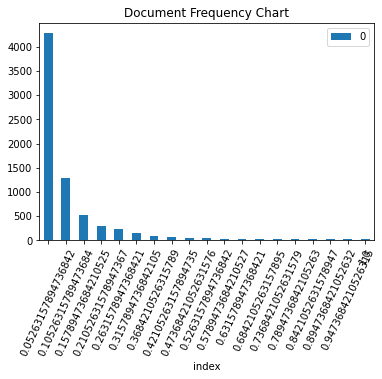

In [59]:
import matplotlib.pyplot as plot
# Draw a vertical bar chart

df_analysis.plot.bar(x="index", y=0, rot=65, title="Document Frequency Chart");

plot.show(block=True);

In [60]:
# from sklearn.feature_extraction.text import CountVectorizer 

# cv=CountVectorizer(stop_words=stop_words,ngram_range=(1,3)) # min_df =0.05263 # trying different things

# word_count_vector=cv.fit_transform(sample_data_w_lemma)

In [61]:
# from sklearn.feature_extraction.text import CountVectorizer 

# cv=CountVectorizer(stop_words=stop_words,ngram_range=(1,1)) # min_df =0.05263 # trying different things

# word_count_vector=cv.fit_transform(sample_data_w_lemma)

In [62]:
sample_cleaned_data[0]

'Die Hochschule an der Sie im Dezember zur Promotion registriert waren hat ebenfalls Interesse daran mehr über die Promotionsbedingungen ihrer Promovierenden zu erfahren. Um Doppelbefragungen zu vermeiden möchten wir die von Ihnen innerhalb dieses Fragebogens angegebenen Antworten an Ihre Hochschule zum Zweck der Qualitätssicherung und Evaluation im Bereich der Doktorandenausbildung Ihr Einverständnis vorausgesetzt weiter geben. Ja ich bin mit der Weitergabe meiner Angaben an die Hochschule einverstanden. Nein ich bin mit der Weitergabe meiner Angaben an die Hochschule nicht einverstanden. Anfang Dezember waren Sie an Ihrer Hochschule offiziell als Doktorand in registriert. In der Zwischenzeit kann sich daran etwas geändert haben. Bitte geben Sie an was aktuell auf Sie zutrifft. Ich promoviere. Ich habe das Promotionsverfahren abgeschlossen. Ich habe mein Promotionsvorhaben unterbrochen. Ich habe mein Promotionsvorhaben abgebrochen. Handelt es sich um eine offiziell der Hochschule geme

In [63]:
from keyphrase_vectorizers import KeyphraseCountVectorizer
#Init default vectorizer.
cv = KeyphraseCountVectorizer(pos_pattern= '((<ART.*>|<AD.*>)*<N.*>+)((<KO.*>|<AP.*>)+((<ART.*>|<AD.*>)*<N.*>+))*|(<ADJ.*>*<N.*>+)')
word_count_vector=cv.fit_transform(sample_cleaned_data)

In [64]:
print(cv.get_params())

{'binary': False, 'dtype': <class 'numpy.int64'>, 'lowercase': True, 'max_df': None, 'min_df': None, 'pos_pattern': '((<ART.*>|<AD.*>)*<N.*>+)((<KO.*>|<AP.*>)+((<ART.*>|<AD.*>)*<N.*>+))*|(<ADJ.*>*<N.*>+)', 'spacy_pipeline': 'en_core_web_sm', 'stop_words': 'english', 'workers': 1}


In [65]:
word_count_vector.shape
#We have 19 (rows) documents and 3003 unique words (columns)!
# With stopwords

(19, 8066)

In [66]:
cv.stop_words #gives you the stop words that CountVectorizer inferred from your min_df and max_df settings as well as those that were cut off during feature selection (through the use of max_features)

'english'

In [67]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True)

tfidf_transformer.fit(word_count_vector)

TfidfTransformer()

In [68]:
feature_names=cv.get_feature_names()

/home/pawan/.local/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names() is deprecated in scikit-learn 1.0 and will be removed with scikit-learn 1.2. Please use get_feature_names_out() instead.
  warnings.warn(msg, category=FutureWarning)


In [69]:
feature_names

['mehr leisten kann',
 'befinden sie sich aktuell',
 'sowohl freiwillig als',
 'graduiertenschulen',
 'einschreibung',
 'masterstudium zu',
 'effizient erledigt',
 'recht berlin',
 'rückkehr ist bereits',
 'aber nicht anschaffungskosten für einen computer ein instrument',
 'antrag auf annahme als doktorand',
 'psychotherapeut',
 'einen vermutlich nur geringen nutzen für',
 'es fehlt',
 'leer',
 'technische ausstattung arbeitsmittel',
 'zum steuerberater begonnen',
 'eigenes einkommen vermögen ist war zu hoch',
 'wie finanzieren sie ihren lebensunterhalt',
 'ihrer organisationseinheit',
 'ausbilder',
 'ausland anderen',
 'wie wichtig sind für sie',
 'noerdl marianen ozeanien',
 'für sich',
 'blogs plattformen',
 'facharbeiterin',
 'pädagogische hochschule',
 'welchem sektor sind sie',
 'wissenschaftliche mitarbeiterin prokuristin abteilungsleiterin meisterin',
 'sommersemester sind sie',
 'sie namentlich',
 'bibliothek rechenzentrum laborplätze',
 'veranstaltungen fachtagungen kurse sem

In [70]:
# feature_names.index('mobilität')

In [71]:
# def sort_coo(coo_matrix):
#     tuples = zip(coo_matrix.col, coo_matrix.data)
#     return sorted(tuples, key=lambda x: (x[1], x[0]), reverse=True)

# def extract_topn_from_vector(feature_names, sorted_items, topn):
#     """get the feature names and tf-idf score of top n items"""
    
#     #use only topn items from vector
#     sorted_items = sorted_items[:topn]

#     score_vals = []
#     feature_vals = []
    
#     # word index and corresponding tf-idf score
#     for idx, score in sorted_items:
        
#         #keep track of feature name and its corresponding score
#         score_vals.append(round(score, 3))
#         feature_vals.append(feature_names[idx])

#     #create a tuples of feature,score
#     #results = zip(feature_vals,score_vals)
#     results= {}
#     for idx in range(len(feature_vals)):
#         results[feature_vals[idx]]=score_vals[idx]
    
#     return results

# def get_keywords(vectorizer, feature_names, doc):
#     """Return top k keywords from a doc using TF-IDF method"""

#     #generate tf-idf for the given document
#     tf_idf_vector = vectorizer.transform(cv.transform([doc]))
    
#     #sort the tf-idf vectors by descending order of scores
#     sorted_items=sort_coo(tf_idf_vector.tocoo())

#     #extract only TOP_K_KEYWORDS
#     keywords=extract_topn_from_vector(feature_names,sorted_items,400)
    
#     return (keywords)


In [72]:
def sort_coo(coo_matrix):
    tuples = zip(coo_matrix.col, coo_matrix.data)
    return sorted(tuples, key=lambda x: (x[1], x[0]), reverse=True)

def extract_topn_from_vector(feature_names, sorted_items):
    """get the feature names and tf-idf score of top n items"""
    
    #use only topn items from vector
    sorted_items = sorted_items

    score_vals = []
    feature_vals = []
    
    # word index and corresponding tf-idf score
    for idx, score in sorted_items:
        
        #keep track of feature name and its corresponding score
        score_vals.append(round(score, 3))
        feature_vals.append(feature_names[idx])

    #create a tuples of feature,score
    #results = zip(feature_vals,score_vals)
    results= {}
    for idx in range(len(feature_vals)):
        results[feature_vals[idx]]=score_vals[idx]
    
    return results

def get_keywords(vectorizer, feature_names, doc):
    """Return top k keywords from a doc using TF-IDF method"""

    #generate tf-idf for the given document
    tf_idf_vector = vectorizer.transform(cv.transform([doc]))
    
    #sort the tf-idf vectors by descending order of scores
    sorted_items=sort_coo(tf_idf_vector.tocoo())

    #extract only TOP_K_KEYWORDS
    keywords=extract_topn_from_vector(feature_names,sorted_items)
    
    return (keywords)


In [73]:
result = []
for doc in sample_cleaned_data:
    df = {}
    df['Text'] = doc
    df['top_keywords'] = get_keywords(tfidf_transformer, feature_names, doc)
    result.append(df)
    
final = pd.DataFrame(result)
final

,Text,top_keywords
0,Die Hochschule an der Sie im Dezember zur Prom...,"{'der': 0.314, 'sie': 0.288, 'und': 0.251, 'zu..."
1,Wie ist dieser studienvorbereitende Kurs verla...,"{'ich': 0.327, 'kurs': 0.298, 'sie': 0.244, 'z..."
2,Welchen Studienabschluss haben Sie in Ihrem le...,"{'sie': 0.407, 'masterstudium': 0.278, 'der': ..."
3,An welcher Art Hochschule studieren Sie. Unive...,"{'völlig': 0.362, 'ich': 0.284, 'zu': 0.28, 'd..."
4,Wie würden Sie Ihre derzeitige Tätigkeit bzw. ...,"{'bis mitarbeiter innen': 0.293, 'sie': 0.253,..."
5,Waren oder sind Sie seit der letzten Befragung...,"{'sie': 0.439, 'ich': 0.31, 'der': 0.204, 'zu'..."
6,Wie zufrieden sind Sie mit Ihrem bisherigen Bi...,"{'sie': 0.381, 'zu': 0.252, 'ja': 0.21, 'studi..."
7,In welcher Sprache möchten Sie die Befragung d...,"{'value': 0.385, 'der': 0.362, 'die': 0.303, '..."
8,Waren oder sind Sie seit der letzten Befragung...,"{'sie': 0.482, 'haben': 0.211, 'haben sie': 0...."
9,Welchen Abschluss streben Sie in Ihrem derzeit...,"{'hs': 0.76, 'abt': 0.494, 'fh': 0.297, 'berli..."


In [74]:
final['top_keywords'][0] # document 8 have 189 keywords(<topk(200)) and document 14 have 187 keywords

{'der': 0.314,
 'sie': 0.288,
 'und': 0.251,
 'zu': 0.23,
 'die': 0.217,
 'ich': 0.209,
 'promotion': 0.205,
 'meiner promotion': 0.133,
 'mit': 0.132,
 'für': 0.132,
 'oder': 0.126,
 'und zwar': 0.122,
 'zwar': 0.122,
 'ihre': 0.114,
 'wie': 0.112,
 'betreuer': 0.105,
 'das thema': 0.102,
 'auf': 0.098,
 'ja': 0.097,
 'haben': 0.093,
 'ihrer promotion': 0.09,
 'ihrer': 0.088,
 'ist': 0.088,
 'nein': 0.087,
 'nicht': 0.086,
 'den': 0.086,
 'ein': 0.081,
 'durch': 0.079,
 'eine': 0.079,
 'sehr': 0.077,
 'thema': 0.073,
 'das': 0.072,
 'mir': 0.071,
 'ich habe': 0.068,
 'hat': 0.067,
 'sich': 0.065,
 'es': 0.065,
 'meiner': 0.065,
 'der wissenschaft': 0.064,
 'quartal': 0.064,
 'aussagen': 0.061,
 'forschungs': 0.06,
 'verfassen': 0.058,
 'einer': 0.058,
 'sonstiges': 0.056,
 'wissenschaft': 0.056,
 'zum': 0.055,
 'haben sie': 0.054,
 'als': 0.054,
 'der universität': 0.051,
 'promotionsprogramm': 0.05,
 'außerhalb der wissenschaft': 0.05,
 'bereich': 0.05,
 'hochschule': 0.05,
 'ihr': 0

In [75]:
new_filtered_keywords = []
new_filtered_keyphrases = []
for i in range(len(list(final['top_keywords']))):
    new_filtered_keywords.append([])
    new_filtered_keyphrases.append([])
    for elem in list(final['top_keywords'][i]):
        if len(elem[0].split()) ==1:
            new_filtered_keywords[i].append(elem)
        else:
            new_filtered_keyphrases[i].append(elem)

In [76]:
# # open file in write mode
# with open(r'/home/pawan/TF-IDF/sales.txt', 'w') as fp:
#     for item in test:
#         # write each item on a new line
#         fp.write("%s\n" % item)
#     print('Done')

In [77]:
final['Valid_Ground_Truth']= data ['Valid_Ground_Truth']

In [78]:
from sklearn.metrics import jaccard_score

In [79]:
#Cosine similarity
nlp("vereinbarkeit von beruf").similarity(nlp("vereinbarkeit von familie und beruf"))

0.8976663481943389

In [80]:
#jaccard
import distance
distance.jaccard("vereinbarkeit von beruf", "vereinbarkeit von familie und beruf")

0.1875

In [81]:
def levenshtein(s1, s2):
    if len(s1) < len(s2):
        return levenshtein(s2, s1)
    
    if len(s2) == 0:
        return len(s1)

    previous_row = range(len(s2) + 1)
    for i, c1 in enumerate(s1):
        current_row = [i + 1]
        for j, c2 in enumerate(s2):
            insertions = previous_row[j + 1] + 1 # j+1 instead of j since previous_row and current_row are one character longer
            deletions = current_row[j] + 1       # than s2
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row
    
    return previous_row[-1]

In [82]:
levenshtein("vereinbarkeit von beruf", "vereinbarkeit von familie und beruf")

12

In [83]:
#levenshtein
from difflib import SequenceMatcher
def similar(a,b):
    return SequenceMatcher(None,a,b).ratio()

In [84]:
similar("vereinbarkeit von beruf", "vereinbarkeit von familie und beruf")

0.7931034482758621

In [85]:
SequenceMatcher(None,"vereinbarkeit von beruf", "vereinbarkeit von familie und beruf").ratio()

0.7931034482758621

In [86]:
import jellyfish
jellyfish.levenshtein_distance("vereinbarkeit von beruf", "vereinbarkeit von familie und beruf")

12

In [87]:
jellyfish.jaro_distance("vereinbarkeit von beruf", "vereinbarkeit von familie und beruf")

0.8567287784679088

In [88]:
jellyfish.jaro_winkler_similarity("vereinbarkeit von beruf", "vereinbarkeit von familie und beruf")

0.9140372670807453

In [89]:
jellyfish.match_rating_comparison("von", "von vereinbarkeit familie und beruf")

In [90]:
final['Ground_Truth']= data['Ground_Truth']

In [91]:
# final.to_csv("keywords_After_POS.csv")

In [92]:
predicted=[]
chunk_size = 1 #coz max ground truth size is 20
for i in range(len(final['top_keywords'])):
    predicted.append([])           #used for nested list
    for j in range(1,int(len(final['top_keywords'][i])/chunk_size)+1):
        predicted[i].append(list(final['top_keywords'][i].keys())[0:j*chunk_size])

In [93]:
predicted[12]

[['sie'],
 ['sie', 'corona pandemie'],
 ['sie', 'corona pandemie', 'und'],
 ['sie', 'corona pandemie', 'und', 'ich'],
 ['sie', 'corona pandemie', 'und', 'ich', 'wie'],
 ['sie', 'corona pandemie', 'und', 'ich', 'wie', 'semester'],
 ['sie', 'corona pandemie', 'und', 'ich', 'wie', 'semester', 'die'],
 ['sie',
  'corona pandemie',
  'und',
  'ich',
  'wie',
  'semester',
  'die',
  'diesem semester'],
 ['sie',
  'corona pandemie',
  'und',
  'ich',
  'wie',
  'semester',
  'die',
  'diesem semester',
  'mit'],
 ['sie',
  'corona pandemie',
  'und',
  'ich',
  'wie',
  'semester',
  'die',
  'diesem semester',
  'mit',
  'der'],
 ['sie',
  'corona pandemie',
  'und',
  'ich',
  'wie',
  'semester',
  'die',
  'diesem semester',
  'mit',
  'der',
  'ja'],
 ['sie',
  'corona pandemie',
  'und',
  'ich',
  'wie',
  'semester',
  'die',
  'diesem semester',
  'mit',
  'der',
  'ja',
  'bis'],
 ['sie',
  'corona pandemie',
  'und',
  'ich',
  'wie',
  'semester',
  'die',
  'diesem semester',
  

In [94]:
len(predicted[0])   #predicted[0][-1] shows all the keywords in document 0, that is 200 keywords

1559

In [95]:
gt_for_top_15 = list(final['Ground_Truth']) #it will append the ground truth for top 15 documents so length of ground truth documents here is 15

In [96]:
len(gt_for_top_15)

19

In [97]:
ground_truth =[]
for i in range(len(gt_for_top_15)):
    ground_truth.append([gt_for_top_15[i]])

In [98]:
for i in range(len(ground_truth)):
    ground_truth[i]= ground_truth[i][0].split(",")

In [99]:
for i in range(len(ground_truth)):
    for j in range(len(ground_truth[i])):
        ground_truth[i][j] = ground_truth[i][j].strip()

In [100]:
ground_truth

[["'wissenschaftssystem'",
  "'betreuung'",
  "'wissenschaftliche karriere'",
  "'promotionsformen'",
  "'promotionsmotive'",
  "'vereinbarkeit von familie und beruf'",
  "'monetäre erträge'",
  "'nicht-monetäre erträge'",
  "'wissenschaftlicher nachwuchs'",
  "'promotionsabbruch'",
  "'promovierende'",
  "'promotion'",
  "'strukturierte promotion'",
  "'persönlichkeit'",
  "'finanzierung'",
  "'mobilität'",
  "'gesundheit'",
  "'erwerbsverläufe'",
  "'arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft'",
  "'promovierte'"],
 ["'integration'",
  "'geflüchtete'",
  "'studienkolleg'",
  "'migration'",
  "'studienvorbereitung'"],
 ["'beruflicher verbleib von exmatrikulierten'",
  "'studiensituation'",
  "'studienabbruch'",
  "'masterstudium'",
  "'abbruchursachen'"],
 ["'evaluation'",
  "'qualifikation'",
  "'effizienz'",
  "'studiensituation'",
  "'zeitreihen'",
  "'studierendenbefragung'",
  "'hochschulforschung'"],
 ["'hochschulforschung'"],
 ["'promotion'",
  "'hochschulforsc

In [101]:
keyphrases_within_text[12]

['digitale lehre', 'finanzielle situation']

In [102]:
# ######################################################
# # function to evaluate success of keyword extraction #
# ######################################################

def evaluate_keywords(proposed,only_keywords):
  """
  Returns precision, recall, and f1 score for proposed keywords against ground truth
  """
  proposed_set = set(proposed)
  true_set = set(only_keywords)
  
  true_positives = len(proposed_set.intersection(true_set))
  if len(proposed_set)==0:
    precision = 0
  else:
    # note denominator reflects total number of words
    # not total number of unique words
    precision = true_positives/float(len(proposed)) 
      
  if len(true_set)==0:
    recall = 0
  else:
    recall = true_positives/float(len(true_set))
  
  if precision + recall > 0:
    f1 = 2*precision*recall/float(precision + recall)
  else:
    f1 = 0

  return (precision, recall, f1)

In [103]:
# def evaluate_keywords(nlp,proposed,keyphrases_within_text):
#   """
#   Returns precision, recall, and f1 score for proposed keywords against ground truth
#   """
  
#   proposed_set = list(set(proposed))
#   true_set = list(set(keyphrases_within_text))
#   tp_temp = []
  
#   for i in range(len(proposed_set)):
#         for j in range(len(true_set)):
#             if nlp(proposed_set[i]).similarity(nlp(true_set[j])) > 0.96:  #cosine similarity
#                 tp_temp.append(true_set[j])
#                 break
            
#   true_positives = len(tp_temp)
# #   true_positives = len(proposed_set.intersection(true_set))
#   if len(proposed_set)==0:
#     precision = 0
#   else:
#     # note denominator reflects total number of words
#     # not total number of unique words
#     precision = true_positives/float(len(proposed)) 
      
#   if len(true_set)==0:
#     recall = 0
#   else:
#     recall = true_positives/float(len(true_set))
  
#   if precision + recall > 0:
#     f1 = 2*precision*recall/float(precision + recall)
#   else:
#     f1 = 0

#   return (precision, recall, f1)

In [104]:
metric_values = []
for i in range(len(predicted)):
    metric_values.append([]) 
    for j in range(len(predicted[i])):
        metric_values[i].append(evaluate_keywords(predicted[i][j], keyphrases_within_text[i]))

In [105]:
precison_values = []

for i in range(len(metric_values)):
    precison_values.append([])
    for a_tuple in metric_values[i]:
        precison_values[i].append(a_tuple[0])

In [106]:
precison_values[12][370]

0.0026954177897574125

In [107]:
precison_values[12].index(max(precison_values[12]))

291

In [108]:
recall_values = []
for i in range(len(metric_values)):
    recall_values.append([])
    for a_tuple in metric_values[i]:
        recall_values[i].append(a_tuple[1])

In [109]:
max(recall_values[12])

0.5

In [110]:
recall_values[12].index(max(recall_values[12]))

291

Graph for document 0


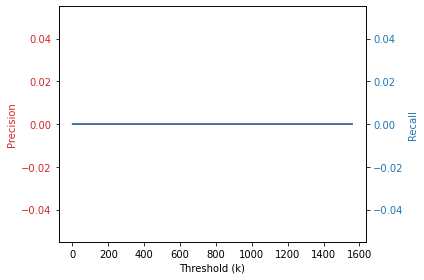

Graph for document 1


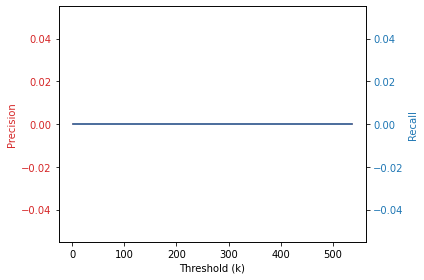

Graph for document 2


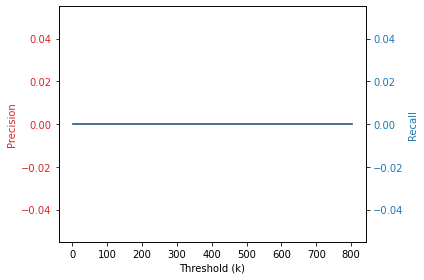

Graph for document 3


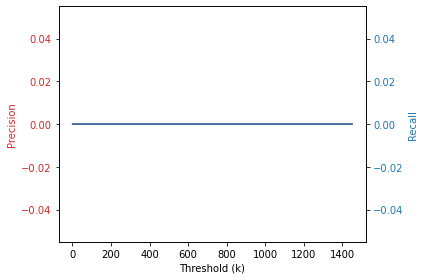

Graph for document 4


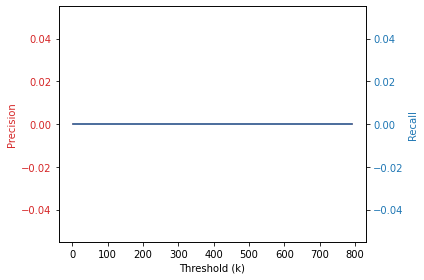

Graph for document 5


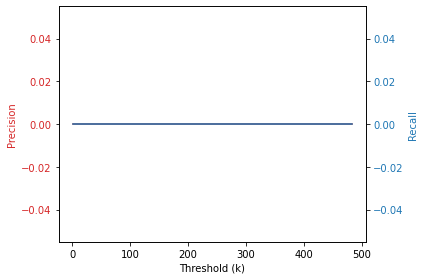

Graph for document 6


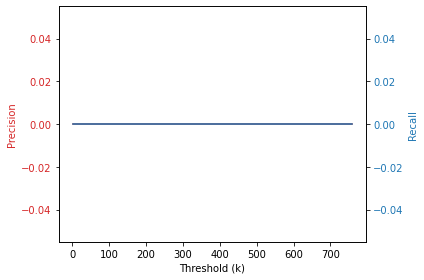

Graph for document 7


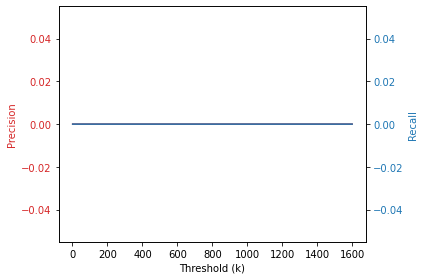

Graph for document 8


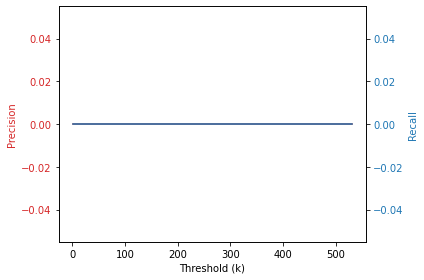

Graph for document 9


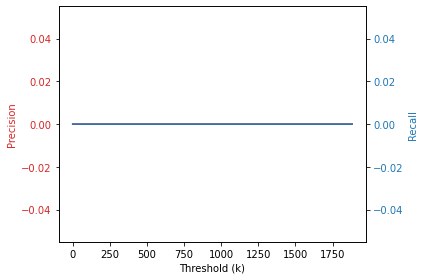

Graph for document 10


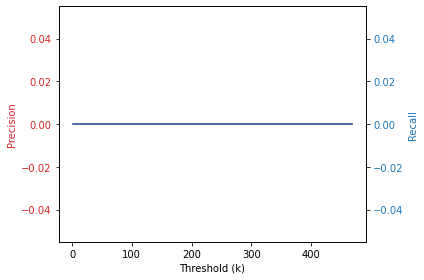

Graph for document 11


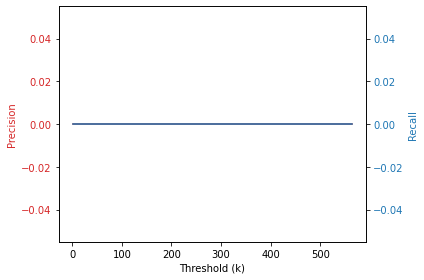

Graph for document 12


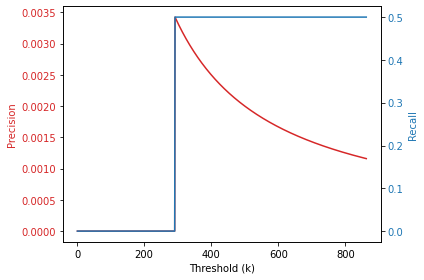

Graph for document 13


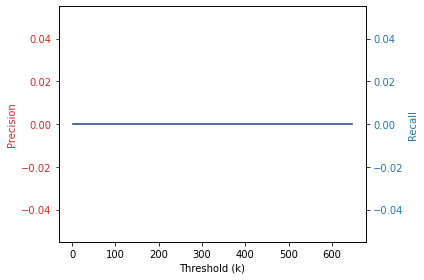

Graph for document 14


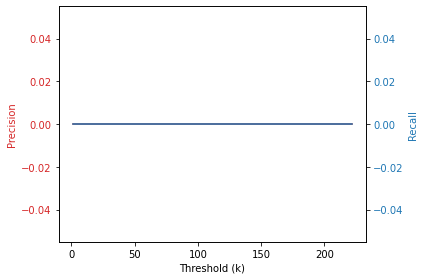

Graph for document 15


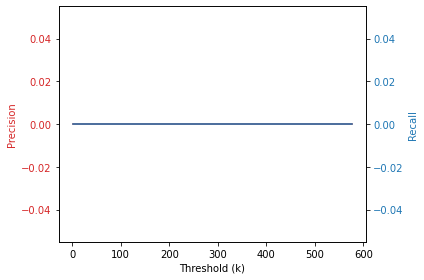

Graph for document 16


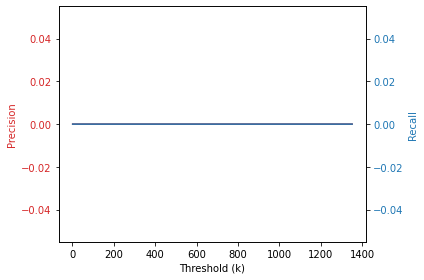

Graph for document 17


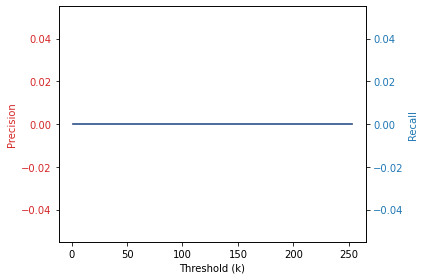

Graph for document 18


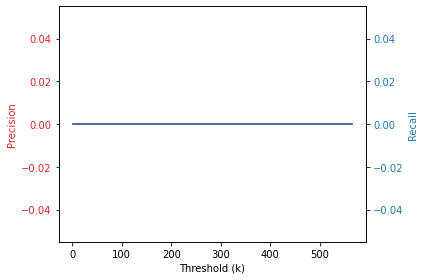

In [111]:
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages


for i in range(len(precison_values)):
        print("Graph for document "+ str(i))
    
        # Create some mock data
        t = [x for x in range(1,(len(precison_values[i])+1))]
        data1 = precison_values[i]
        data2 = recall_values[i]

        fig, ax1 = plt.subplots()

        color = 'tab:red'
        ax1.set_xlabel('Threshold (k)')
        ax1.set_ylabel('Precision', color=color)
        ax1.plot(t, data1, color=color)
        ax1.tick_params(axis='y', labelcolor=color)

        ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

        color = 'tab:blue'
        ax2.set_ylabel('Recall', color=color)  # we already handled the x-label with ax1
        ax2.plot(t, data2, color=color)
        ax2.tick_params(axis='y', labelcolor=color)

        fig.tight_layout()  # otherwise the right y-label is slightly clipped
        fig.patch.set_visible(False)
#         plt.savefig(str(i) + 'Document.png',  dpi=200)  #to save the plots
        plt.show()
      

In [127]:
data

,Documents,file_name,Text,Ground_Truth,Valid_Ground_Truth,Ground_Truth_Not_In_Text,clean_text,clean_text_wo_sw,final_cleaned_text
0,document1,Nacaps-W1_questionnaire,"""Die Hochschule, an der Sie im Dezember 2018 z...","'wissenschaftssystem', 'betreuung', 'wissensch...","[wissenschaftssystem, betreuung, wissenschaftl...","[promotionsformen, promotionsmotive, monetäre ...",Die Hochschule an der Sie im Dezember zur Prom...,hochschule dezember promotion registriert eben...,Die Hochschule an der Sie im Dezember zur Prom...
1,document2,WeGe_W2,"""Wie ist dieser studienvorbereitende Kurs verl...","'integration', 'geflüchtete', 'studienkolleg',...","[geflüchtete, studienkolleg, studienvorbereitung]","[integration, migration]",Wie ist dieser studienvorbereitende Kurs verla...,studienvorbereitende kurs verlaufen kurs beend...,Wie ist dieser studienvorbereitende Kurs verla...
2,document3,StuMa2020,"""Welchen Studienabschluss haben Sie in Ihrem l...","'beruflicher verbleib von exmatrikulierten', '...",[masterstudium],"[beruflicher verbleib von exmatrikulierten, st...",Welchen Studienabschluss haben Sie in Ihrem le...,studienabschluss letzten studium sommersemeste...,Welchen Studienabschluss haben Sie in Ihrem le...
3,document4,Studierdenensurvey2016,"""An welcher Art Hochschule studieren Sie. Univ...","'evaluation', 'qualifikation', 'effizienz', 's...","[evaluation, qualifikation, studiensituation]","[effizienz, zeitreihen, studierendenbefragung,...",An welcher Art Hochschule studieren Sie . Univ...,art hochschule studieren universität technisch...,An welcher Art Hochschule studieren Sie. Unive...
4,document5,Absolventen_2009.2_Haupt,"""Wie würden Sie Ihre derzeitige Tätigkeit bzw....",'hochschulforschung',[],[hochschulforschung],Wie würden Sie Ihre derzeitige Tätigkeit bzw ....,derzeitige tätigkeit situation bezeichnen kurz...,Wie würden Sie Ihre derzeitige Tätigkeit bzw. ...
5,document6,Promopanel_W4,"""Waren oder sind Sie seit der letzten Befragun...","'promotion', 'hochschulforschung', 'promotion'...","[promotion, arbeitsbedingungen, wissenschaftli...",[hochschulforschung],Waren oder sind Sie seit der letzten Befragung...,letzten befragung irgendeiner form erwerbstäti...,Waren oder sind Sie seit der letzten Befragung...
6,document7,Studienberechtigte_2008.3,"""Wie zufrieden sind Sie mit Ihrem bisherigen B...","'studienberechtigte', 'hochschulforschung'",[],"[studienberechtigte, hochschulforschung]",Wie zufrieden sind Sie mit Ihrem bisherigen Bi...,zufrieden bisherigen bildungs berufsweg zufrie...,Wie zufrieden sind Sie mit Ihrem bisherigen Bi...
7,document8,Wissenschaftlerbefragung2016,"""In welcher Sprache möchten Sie die Befragung ...",'hochschulforschung',[],[hochschulforschung],In welcher Sprache möchten Sie die Befragung d...,sprache befragung durchführen please select yo...,In welcher Sprache möchten Sie die Befragung d...
8,document9,Promopanel_W3,"""Waren oder sind Sie seit der letzten Befragun...","'promotion', 'hochschulforschung', 'promotion'...","[promotion, arbeitsbedingungen, wissenschaftli...",[hochschulforschung],Waren oder sind Sie seit der letzten Befragung...,letzten befragung irgendeiner form erwerbstäti...,Waren oder sind Sie seit der letzten Befragung...
9,document10,Sozialerhebung20,"""Welchen Abschluss streben Sie in Ihrem derzei...",'hochschulforschung',[],[hochschulforschung],Welchen Abschluss streben Sie in Ihrem derzeit...,abschluss streben derzeitigen studiengang bach...,Welchen Abschluss streben Sie in Ihrem derzeit...


In [113]:
check_new = [elem for elem in list(final['top_keywords'][12])]
len(check_new)

862

In [114]:
check_new

['sie',
 'corona pandemie',
 'und',
 'ich',
 'wie',
 'semester',
 'die',
 'diesem semester',
 'mit',
 'der',
 'ja',
 'bis',
 'der corona pandemie',
 'nicht',
 'nein',
 'sommersemester',
 'wintersemester',
 'auf',
 'zu',
 'folgenden',
 'haben',
 'sich',
 'lehrenden',
 'personen',
 'mit meinem',
 'abschluss',
 'den',
 'eltern',
 'lehre',
 'anderen',
 'digitaler lehre',
 'freund innen',
 'einer',
 'haben sie',
 'elternteil',
 'viele',
 'ist',
 'sind',
 'lehrveranstaltungen',
 'weiß ich',
 'mit meinem meiner ehe partner',
 'verschoben',
 'wie geplant durchgeführt',
 'einem studierendenwohnheim',
 'abgesagt',
 'mit anderen personen',
 'anderen familienangehörigen',
 'für',
 'ihre',
 'geplant',
 'studierenden',
 'durch',
 'weiß ich nicht',
 'bzw',
 'wurden',
 'sehr',
 'mit meinem kind meinen kindern',
 'meinen eltern bzw',
 'hochschule',
 'bekannten',
 'einem',
 'ihrer hochschule',
 'meinem',
 'ihrer',
 'andere',
 'wie häufig',
 'ehe partner',
 'wurde',
 'dem',
 'meinen',
 'studium',
 'sie s

In [115]:
# final['top_keywords'][0]['wissenschaftssystem']

In [116]:
keyphrases_within_text[12]

['digitale lehre', 'finanzielle situation']

In [117]:
list(set(check_new).intersection(keyphrases_within_text[12]))

['digitale lehre']

In [118]:
data['Text'][12]

'"Befinden Sie sich aktuell in einem Urlaubssemester. nein. ja. Halten Sie eine Verlängerung Ihres Studiums aufgrund der Corona-Pandemie für wahrscheinlich. nein, sehr unwahrscheinlich. ja, sehr wahrscheinlich. Wann werden Sie Ihr derzeitiges Studium voraussichtlich abschließen. Semester. Sommersemester 2020. Wintersemester 2020/21. Sommersemester 2021. Wintersemester 2021/22. Sommersemester 2022. Wintersemester 2022/23. Sommersemester 2023. Wintersemester 2023/24. Sommersemester 2024. Wintersemester 2024/25. Sommersemester 2025. Wintersemester 2025/26. Sommersemester 2026. Wintersemester 2026/27. Sommersemester 2027. Wintersemester 2027/28. Sommersemester 2028. Wintersemester 2028/29. Sommersemester 2029. Wintersemester 2029/30. Sommersemester 2030. Wie wichtig ist Ihnen ein Abschluss in Regelstudienzeit. unwichtig. sehr wichtig. In wie vielen Online-Lehrveranstaltungen werden aktive Interaktionsmöglichkeiten angeboten. keiner. etwa der Hälfte. allen. Sind Sie in einem Lehramtsstudien

In [119]:
keyphrases_within_text

[['wissenschaftliche karriere', 'vereinbarkeit von familie und beruf'],
 [],
 [],
 [],
 [],
 ['wissenschaftliche aktivitäten'],
 [],
 [],
 ['wissenschaftliche aktivitäten'],
 [],
 [],
 ['wissenschaftliche aktivitäten'],
 ['digitale lehre', 'finanzielle situation'],
 [],
 [],
 [],
 [],
 [],
 []]

In [120]:
# check_new.index('wohnsituation') 

 within the top 200 keywords , this scenario(considering only Noun) capture the keyword 'studiensituation', that is why we see the different trend in the graph for few documents compared to Noun+adjectives, we can also say that in our corpus(for that document) we have less number of adjectives.

In [132]:
# for every document : finding the location of best Recall values for first 15 document(top k for each doc)
# we are working on Recall because for DZHW , Recall is important

# Recall_Scores= recall_values[0:15]   #extracting Recall values of first 15 document(because we are also training on first 15 documents)

best_recall_indices = []
for i in range(len(recall_values)):
    best_recall_indices.append(recall_values[i].index(max(recall_values[i]))) #gives location for best recall_values for each documents

In [133]:
best_recall_indices # will give us index of best recall_values for each docuemnts, for example: for document 0, at index 168 we have the best recall value(check below for that particular value)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 291, 0, 0, 0, 0, 0, 0]

In [134]:
best_recall_indices_element = []

for i in range(len(best_recall_indices)):
    Recall_values = recall_values[i]
    best_recall_indices_element.append(Recall_values[best_recall_indices[i]])

In [135]:
best_recall_indices_element

[0.0, 0, 0, 0, 0, 0.0, 0, 0, 0.0, 0, 0, 0.0, 0.5, 0, 0, 0, 0, 0, 0]

In [136]:
best_precision_indices = []
for i in range(len(precison_values)):
    best_precision_indices.append(precison_values[i].index(max(precison_values[i])))

In [137]:
best_precision_indices

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 291, 0, 0, 0, 0, 0, 0]

In [138]:
best_precision_indices_element = []

for i in range(len(best_precision_indices)):
    Precision_values = precison_values[i]
    best_precision_indices_element.append(Precision_values[best_precision_indices[i]])

In [139]:
best_precision_indices_element

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.003424657534246575,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]